# Import

In [1]:
pip install pycocotools torchinfo torchvision==0.16

  Obtaining dependency information for pycocotools from https://files.pythonhosted.org/packages/ba/64/0451cf41a00fd5ac4501de4ea0e395b7d909e09d665e56890b5d3809ae26/pycocotools-2.0.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for torchvision==0.16 from https://files.pythonhosted.org/packages/84/eb/4f6483ae9094e164dc5b9b792e377f7d37823b0bedc3eef3193d416d2bb6/torchvision-0.16.0-cp310-cp310-manylinux1_x86_64.whl.metadata
  Obtaining dependency information for torch==2.1.0 from https://files.pythonhosted.org/packages/6d/13/b5e8bacd980b2195f8a1741ce11cbb9146568607795d5e4ff510dcff1064/torch-2.1.0-cp310-cp310-manylinux1_x86_64.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 50.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 75.6 MB/s eta 0:00:0000:0100:01
  Obtaining dependency information for

In [2]:
import os
import time
import datetime
import random
import collections
import numpy as np
import pandas as pd
import torch
from torch import nn, Tensor
import torchvision
from torchvision.transforms import ToTensor, ToPILImage, functional as F, v2
from torchvision.models.detection import transform, MaskRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision import ops #Copy and paste
from torchvision.transforms import InterpolationMode
from torchvision import tv_tensors
import math
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import pycocotools
from pycocotools.coco import COCO
import pycocotools.mask as mask
from pycocotools.cocoeval import COCOeval
from PIL import Image
import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from typing import Any, Dict, List, Optional, Tuple
import copy
from torchinfo import summary
import json
from tqdm.auto import tqdm #Progress bar

# Required magic to display matplotlib plots in notebooks
%matplotlib inline
pil2tensor = ToTensor()
tensor2pil = ToPILImage()


In [6]:
print(torchvision.__version__)

0.16.0+cu121


# Utils
### Utility methods

In [ ]:
def myResourcePath(fname, directory):
    filename = os.path.join(directory, fname)
    if not os.path.exists(filename):
        raise RuntimeError(f'file not found {filename}')
    return filename


def printDatasetInfo(coco_obj:COCO):
    
    categories = coco_obj.loadCats(coco_obj.getCatIds())

    print("Available categories:")
    for category in categories:
        print(f"   ID: {category['id']}, Name: {category['name']}")

    total_images = len(coco_obj.getImgIds())
    print(f"\nTotal number of images in the dataset: {total_images}")

    print("\nDetails per category:")
    for category in categories:
        cat_id = category['id']
        curr_name = category['name']
        image_ids = coco_obj.getImgIds(catIds=cat_id)
        instance_ids = coco_obj.getAnnIds(catIds=cat_id)
        
        print(f"\nCategory: {curr_name}")
        print(f"   Number of images: {len(image_ids)}")
        print(f"   Number of instances: {len(instance_ids)}")

'''
@output: tensor of an image [C,H,W]
'''

def getImgbyID2Tensor(img_id,coco_dataset:COCO,source):
    image_data = coco_dataset.loadImgs(img_id)[0]
    image_path = myResourcePath(image_data['file_name'], source)
    image = Image.open(image_path)
    image=pil2tensor(image)
    return image


def save_on_master(*args, **kwargs):
    torch.save(*args, **kwargs)


#DISPLAY IMAGES

def print_legend(colors, labels,ax):
    pat = [patches.Patch(color=color, label=label) for color, label in zip(colors, labels)]
    ax.legend(handles=pat, loc='center', bbox_to_anchor=(0.5, -0.1), ncol=len(colors))

def displayImageWithBoxesAndMasksWithRle(coco,colors,categories,IMGSRC,image_id,display_type="both"):
    image_data = coco.loadImgs(image_id)[0]

    image_path = myResourcePath(image_data['file_name'], IMGSRC)
    image = np.array(Image.open(image_path))    

    anns_ids = coco.getAnnIds(imgIds=image_id, iscrowd=False)
    anns = coco.loadAnns(anns_ids)
    
    fig, axs = plt.subplots(1,3,figsize=(15,5))
    
    axs[0].imshow(image,interpolation='nearest')
    axs[0].set_title("Immagine originale")
 
    #Display bboxes
    
    if display_type in ['box', 'both']:
        for ann in anns:
            box=ann['bbox']
            category_id=ann["category_id"]
            bb = patches.Rectangle((box[0],box[1]), box[2],box[3], linewidth=1, edgecolor=colors[category_id-1], facecolor="none")
            axs[1].add_patch(bb)
            
        axs[1].imshow(image)
        print_legend(colors, [cat_name['name'] for cat_name in categories],axs[1])
        axs[1].set_title("BBOX")
    
    # Display segmentation polygon
    if display_type in ['seg', 'both']:
        for ann in anns:
            category_id=ann["category_id"]
            for seg in ann['segmentation']:
                poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                polygon = patches.Polygon(poly, closed=False, edgecolor=colors[category_id-1], fill=False)
                axs[2].add_patch(polygon)
        axs[2].imshow(image)
        axs[2].set_title("segmentation polygon")
        
    plt.show()

def polygonFromMask(maskedArr): # https://github.com/hazirbas/coco-json-converter/blob/master/generate_coco_json.py

    contours, _ = cv2.findContours(maskedArr, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    segmentation = []

    for contour in contours:
        # Valid polygons have >= 6 coordinates (3 points)
        if contour.size >= 6:
            segmentation.append(contour.flatten().tolist())
    if len(segmentation)==0:
      return segmentation
    RLEs = mask.frPyObjects(segmentation,maskedArr.shape[0],maskedArr.shape[1])
    RLE = mask.merge(RLEs)
    # RLE = mask.encode(np.asfortranarray(maskedArr))
    area = mask.area(RLE)
    [x, y, w, h] = cv2.boundingRect(maskedArr)

    return segmentation[0] #, [x, y, w, h], area

def displayImageWithBoxesAndMasksWithCounts(coco,COLORS, image_id,IMGSRC,categories,display_type="both"):
    image_data = coco.loadImgs(image_id)[0]

    image_path = myResourcePath(image_data['file_name'], IMGSRC)
    image = np.array(Image.open(image_path))
    
    fig, axs = plt.subplots(1,3,figsize=(15,5))
    axs[0].imshow(image,interpolation='nearest')
    axs[0].set_title("Immagine originale")

    anns_ids = coco.getAnnIds(imgIds=image_id, iscrowd=False)
    anns = coco.loadAnns(anns_ids)

    #Display bboxes

    if display_type in ['box', 'both']:
        for ann in anns:
            if(ann["score"]>0):
                box=ann['bbox']
                category_id=ann["category_id"]-1
                bb = patches.Rectangle((box[0],box[1]), box[2],box[3], linewidth=1, edgecolor=COLORS[category_id], facecolor="none")
                axs[1].add_patch(bb)
        axs[1].imshow(image)
        print_legend(COLORS, [cat_name['name'] for cat_name in categories],axs[1])
        axs[1].set_title("BBOX")
        
    # Display segmentation polygon
    if display_type in ['seg', 'both']:
        for ann in anns:
          if(ann["score"]>0):
            category_id=ann["category_id"]-1
            seg=ann["segmentation"]
            coco_counts_data= seg["counts"]
            maskedArr = mask.decode(seg)
            polygon=polygonFromMask(maskedArr)

            if len(polygon)!=0:
              poly = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
              polygon = patches.Polygon(poly, closed=False, edgecolor=COLORS[category_id], fill=False)
              axs[2].add_patch(polygon)
        axs[2].imshow(image)
        axs[2].set_title("segmentation polygon")
    
    plt.show()


def displayImageWithBoxesAndMasksArray(tensor_image: torch.Tensor, target,COLORS,categories,display_type="both"):
    img= tensor2pil(tensor_image)

    classes = target["labels"].cpu().numpy()
    boxes = target["boxes"].cpu().numpy()
    masksArr = target["masks"].numpy()

    fig, axs = plt.subplots(1,3,figsize=(15,5))
    
    axs[0].imshow(img,interpolation='nearest')
    axs[0].set_title("Immagine originale")
    
    #Display bboxes
    if display_type in ['box', 'both']:
        index=0
        for bbox in boxes:
                category_id=classes[index]-1
                bb = patches.Rectangle((bbox[0],bbox[1]), bbox[2]-bbox[0],bbox[3]-bbox[1], linewidth=1, edgecolor=COLORS[category_id], facecolor="none")
                axs[1].add_patch(bb)
                index+=1
        axs[1].imshow(img)
        print_legend(COLORS, [cat_name['name'] for cat_name in categories],axs[1])
        axs[1].set_title("BBOX")
        
    # Display segmentation polygon
    if display_type in ['seg', 'both']:
        index=0
        for maskArr in masksArr:
            category_id=classes[index]-1
            polygon=polygonFromMask(maskArr)
            if len(polygon)!=0:
              poly = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
              polygon = patches.Polygon(poly, closed=False, edgecolor=COLORS[category_id], fill=False)
              axs[2].add_patch(polygon)
            index+=1
        axs[2].imshow(img)
        axs[2].set_title("segmentation polygon")
        
    plt.show()

# CustomCocoDataset and CocoPolyToMaskConverter
### Create a custom dataset with COCO annotations and convert the annotations into tensors

In [ ]:
def convert_coco_poly_to_mask(anns,coco_dataset:COCO):
        masks = []
        for ann in anns:
            mask = coco_dataset.annToMask(ann)
            mask = torch.as_tensor(mask, dtype=torch.uint8) #:return: binary mask (numpy 2D array)
            masks.append(mask)
        masks = torch.stack(masks, dim=0)
        return masks

class myConvertCocoPolysToMask:
    def __call__(self, id, coco_dataset:COCO):

        image_data= coco_dataset.loadImgs(id)[0] #get imgs for given ids
        
        '''
        {
            "height": 700,
            "width": 700,
            "id": 841,
            "file_name": "46_00446.jpg"
        }
        '''
        image_name = image_data['file_name']
        image_id = id
        w, h = (image_data["width"],image_data["height"])


        anns_ids = coco_dataset.getAnnIds(imgIds=image_id) 
        anns= coco_dataset.loadAnns(anns_ids)
        
        boxes = [obj["bbox"] for obj in anns]
        boxes = [[bbox[0],bbox[1],bbox[2]+bbox[0],bbox[3]+bbox[1]] for bbox in boxes]
        
        boxes = torch.as_tensor(boxes, dtype=torch.float32).reshape(-1,4) # guard against no boxes via reshape
        
        
        '''
         +------------------+
:        |                  |
:      height               |
:        |                  |
:       (xy)---- width -----+
        
        '''
        classes = [(obj["category_id"]) for obj in anns]
        classes = torch.tensor(classes,dtype=torch.int64)
        
        masks = convert_coco_poly_to_mask(anns,coco_dataset)
        
        area = torch.tensor([obj["area"] for obj in anns],dtype=torch.int64)

        keep = (boxes[:, 3] > boxes[:, 1]) & (boxes[:, 2] > boxes[:, 0])
        boxes = boxes[keep]
        classes = classes[keep]
        masks = masks[keep]
        area = area[keep]

        target = {}
        target["boxes"] = boxes
        target["labels"] = classes
        target["masks"] = masks
        target["image_id"] = torch.tensor(image_id,dtype=torch.int64)
        target["area"] = area
        
        return target
        

class CustomCocoDataset(torch.utils.data.Dataset):

    def __init__(self, root, ann_file ,transform=ToTensor(),Aug=False):
        self.coco = COCO(ann_file)
        self.root = root
        self.converter=myConvertCocoPolysToMask()
        self.transform = transform
        self.Aug=Aug


    def __len__(self):
        return len(self.coco.getImgIds())

    def __getitem__(self, idx):
        img_id = self.coco.getImgIds()[idx]
        img_info = self.coco.loadImgs(img_id)[0]

        img=getImgbyID2Tensor(img_id,self.coco,self.root)

        target = self.converter(idx,self.coco)

        if self.Aug:
            transforms = get_transforms(train=True)
            img, target = self.applyTransforms(transforms, img, target)
        return img, target
    
    def applyTransforms(self, transforms, curr_image, curr_target):
        curr_image = tv_tensors.Image(curr_image)
        curr_target['boxes'] = tv_tensors.BoundingBoxes(curr_target['boxes'], format='XYXY', canvas_size=(curr_image.shape[1],curr_image.shape[2]))
        curr_target['masks'] = tv_tensors.Mask(curr_target['masks'], dtype=torch.uint8)
        output = transforms({'image': curr_image, 'boxes': curr_target['boxes'], 'masks': curr_target['masks'], 'labels': curr_target['labels']})
        res_image = output['image']
        res_boxes = output['boxes']
        res_masks = output['masks']
        res_labels = output['labels']
        curr_target['boxes'] = res_boxes
        curr_target['masks'] = res_masks
        curr_target['labels'] = res_labels
        return res_image, curr_target

# Data Augmentation

In [9]:
def get_transforms(train=True):
    if train:
        return v2.Compose([
            v2.RandomChoice([
                v2.RandomHorizontalFlip(p=1),
                v2.RandomVerticalFlip(p=1),
                v2.RandomRotation([-90,90]),
                v2.RandomResizedCrop(size=[700,700],scale=(0.1,2.0),interpolation=InterpolationMode.BILINEAR,antialias=True)
            ]),
            v2.RandomApply(torch.nn.ModuleList([
                v2.ColorJitter(
                    brightness = (0.875, 1.125),
                    contrast = (0.5, 1.5),
                    saturation = (0.5, 1.5),
                    hue = (-0.05, 0.05)
                )
            ]),p=0.4),
            v2.SanitizeBoundingBoxes(),
            v2.ClampBoundingBoxes()
        ])
    else:
        return v2.Compose([])

# Constant and hyperparameters

In [ ]:
IMGSRC_TR = "/kaggle/input/progetto-cv/trainingset"
IMGSRC_TEST= "/kaggle/input/progetto-cv/testset"
LOG_DIR='log'

# Setup hyperparameters
EPOCH=1
NUM_EPOCHS = 250
BATCH_SIZE = 8
LEARNING_RATE = 0.001

#Setup checkpoint dir
SAVE_DIR="/kaggle/working"
SAVE_DIR_TEST="/kaggle/working"

#Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#if True then resume by checkpoint
RESUME= True

# Dataset info and model definition

In [ ]:
json_file_path_tr = myResourcePath("train.json",IMGSRC_TR)
json_file_path_test=myResourcePath("test.json",IMGSRC_TEST)
coco_tr= COCO(json_file_path_tr)
coco_test=COCO(json_file_path_test)

cmap = plt.get_cmap('tab20b')
categories = coco_tr.loadCats(coco_tr.getCatIds())
COLORS = [cmap(i) for i in np.linspace(0, 1, len(categories))]
# this will help us create a different color for each class

coco: COCO=coco_tr
    
"""
***Dataset Loading***
"""
print("Creating Data Loaders")
train_dataset = CustomCocoDataset(IMGSRC_TR,json_file_path_tr,pil2tensor,Aug=False)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,shuffle=True, num_workers=0,collate_fn=lambda x: (torch.stack([item[0] for item in x],dim=0), [item[1] for item in x])) #x = [(img1, img2, img3,...), ()]

test_dataset=CustomCocoDataset(IMGSRC_TEST,json_file_path_test,pil2tensor,Aug=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE,shuffle=False, num_workers=0,collate_fn=lambda x: (torch.stack([item[0] for item in x],dim=0), [item[1] for item in x])) #x = [(img1, img2, img3,...), ()]

print("Loading Model Mask-RCNN")
torch.cuda.empty_cache()
num_of_classes=len(coco.getCatIds())+1 #Including the background 5

model = torchvision.models.detection.maskrcnn_resnet50_fpn_v2(weights='DEFAULT')
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_of_classes)
# now get the number of input features for the mask classifier
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
# and replace the mask predictor with a new one
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,hidden_layer,num_of_classes)
model=model.to(device)




loading annotations into memory...
Done (t=0.18s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
Creating Data Loaders
loading annotations into memory...
Done (t=0.16s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
Loading Model Mask-RCNN


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth
100%|██████████| 177M/177M [00:10<00:00, 17.5MB/s]   


# Test method definition

In [ ]:
epoch_count = []
train_loss_values= {
    "avg_loss": []
}
best_mAPbbox = 0.0
best_mAPsegm = 0.0

test_values= {
    "epoch": [],
    "mAPbbox": [],
    "mAPsegm": []
}

def evaluationBYJSON(file_json,annType="bbox"):
    detections=coco_test.loadRes(file_json)
    cocoEval = COCOeval(coco_test, detections, annType)
    cocoEval.evaluate()
    cocoEval.accumulate()
    cocoEval.summarize()
    return cocoEval

def evaluation(epoch,annType="bbox"):
    detections=coco_test.loadRes(f'./working/prediction_{epoch}_test.json')
    cocoEval = COCOeval(coco_test, detections, annType)
    cocoEval.evaluate()
    cocoEval.accumulate()
    cocoEval.summarize()
    return cocoEval

def test_and_eval_one_epoch(model,epoch ,threshold = 0.5):
    results = []

    model.eval() #truns off different settings in the model not needed for evaluation/testing
    progress_bar = tqdm(total=len(test_loader), desc="Test")  # Initialize a progress bar

    with torch.inference_mode():
        for batch_id,batch in enumerate(test_loader):
            images: torch.Tensor = batch[0]
            targets: list = batch[1]
            images = images.to(device)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            #model_time = time.time()
            outputs = model(images)

            curr_target=0
            for output in outputs: #output Dict[Tensor] outputs List[Dict[Tensor]]
                # Now we need to extract the bounding boxes and masks
                classes = output["labels"].cpu().numpy()
                scores = output["scores"].cpu().numpy()
                boxes = output["boxes"].view(-1, 4).cpu().numpy()
                masks = output["masks"]
                masks = masks.view(-1, 700, 700).cpu().numpy()
                
                for i in range(masks.shape[0]):
                    image_id=targets[curr_target]["image_id"] 

                    #box mask-rcnn (xmin,ymin,xmax,ymax)
                    bbox = boxes[i] 
                    bbox = [bbox[0],bbox[1],bbox[2]-bbox[0],bbox[3]-bbox[1]]
                    bbox = [round(float(x)*10)/10 for x in bbox]
                    
                    maskT=masks[i]
                    maskT[maskT>threshold]=1
                    maskT[maskT<=threshold]=0

                    rle = pycocotools.mask.encode(np.asfortranarray(maskT.astype(np.uint8)))
                    rle['counts'] = rle['counts'].decode('ascii')
                    
                    results.append({
                        'image_id': int(image_id),
                        'category_id': int(classes[i]),
                        'bbox': bbox,
                        'segmentation': rle,
                        'score': float(scores[i])
                    })
                curr_target+=1
            progress_bar_dict = dict(curr_epoch=epoch,curr_batch=batch_id)
            progress_bar.set_postfix(progress_bar_dict)
            progress_bar.update()
    # save file
    with open(f'./working/prediction_{epoch}_test.json', 'w') as fp:
        json.dump(results, fp)
    curr_mAPbbox=round(evaluation(epoch,annType="bbox").stats[1],3) #decimal truncating 
    curr_mAPsegm=round(evaluation(epoch,annType="segm").stats[1],3) #decimal truncating
    return curr_mAPbbox,curr_mAPsegm
    progress_bar.close()

# Loading the model

In [ ]:
if RESUME:
    checkpoint = torch.load("./checkpoint/model.pth", map_location=device, weights_only=False)
    model.load_state_dict(checkpoint["model"])
    EPOCH = checkpoint["epoch"]
    epoch_count = checkpoint["list_epoch"]
    train_loss_values= checkpoint["dict_losses_tr"]
    test_values=checkpoint["dict_stats_test"]
    best_mAPbbox = checkpoint["best_mAPbbox"]
    best_mAPsegm = checkpoint["best_mAPsegm"]

In [29]:
print(f"Curr AP50 BBOX:{best_mAPbbox} Curr AP50 SEGM:{best_mAPsegm}")


Curr AP50 BBOX:0.658 Curr AP50 SEGM:0.433


# Test the model

In [ ]:
print(f"Curr AP50 BBOX: {best_mAPbbox} Curr AP50 SEGM: {best_mAPsegm}")
print("Start evaluating")
curr_mAPbbox,curr_mAPsegm = test_and_eval_one_epoch(model,START_EPOCH)


# Visualize the model performances from the json file

In [ ]:
path_file_json="./working/bboc658_segm433.json"
evaluationBYJSON(path_file_json)
evaluationBYJSON(path_file_json,annType="segm")

Loading and preparing results...
DONE (t=0.08s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.61s).
Accumulating evaluation results...
DONE (t=0.20s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.435
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.658
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.463
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.234
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.442
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.471
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.518
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.543
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

# Results visualization - Plotting the loss during training

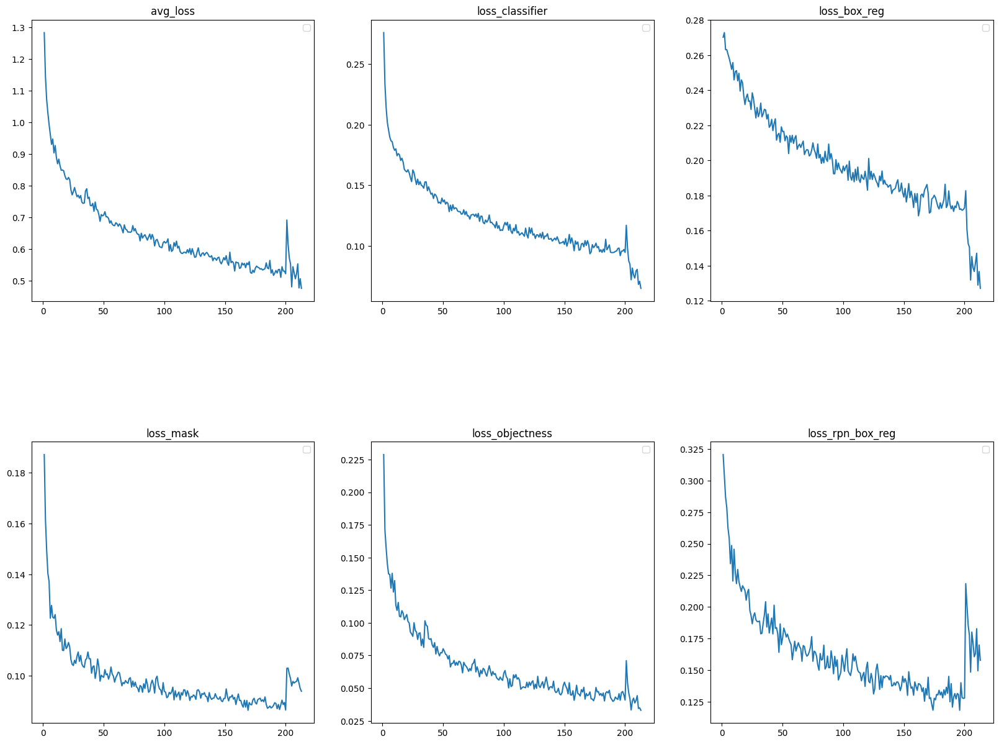

In [ ]:
plt.figure(figsize=(20, 50))
curr_plot=1
for k,v in train_loss_values.items():
    plt.subplot(len(train_loss_values),3,curr_plot)
    plt.plot(epoch_count,v)
    plt.title(k)
    plt.legend()
    curr_plot+=1

plt.subplots_adjust(hspace=0.5)

plt.show()


# mAP50% plots

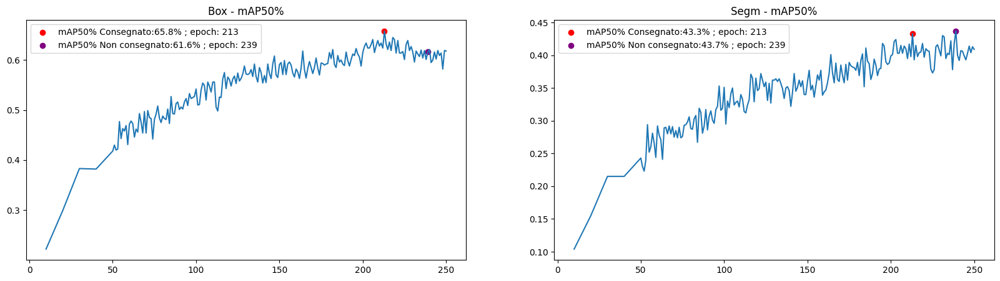

In [ ]:
y_max=max(test_values["mAPbbox"])
idx_y_max=test_values["mAPbbox"].index(y_max)
x_max=test_values["epoch"][idx_y_max]
y_max_2=test_values["mAPsegm"][idx_y_max]

# Other model trained but not chosen as best model
y_max_3=max(test_values["mAPsegm"])
idx_y_max_3=test_values["mAPsegm"].index(y_max_3)
x_max_3=test_values["epoch"][idx_y_max_3]
y_max_4=test_values["mAPbbox"][idx_y_max_3]

plt.figure(figsize=(20, 5))
plt.subplot(1,2,1)
plt.plot(test_values["epoch"],test_values["mAPbbox"])
plt.title("Box - mAP50%")
plt.scatter(x_max,y_max,color="red",label=f"mAP50% Consegnato:{y_max*100}% ; epoch: {x_max}")
plt.scatter(x_max_3,y_max_4,color="purple",label=f"mAP50% Non consegnato:{y_max_4*100}% ; epoch: {x_max_3}")

plt.legend()
plt.subplot(1,2,2)
plt.plot(test_values["epoch"],test_values["mAPsegm"])
plt.title("Segm - mAP50%")
plt.scatter(x_max,y_max_2,color="red",label=f"mAP50% Consegnato:{y_max_2*100}% ; epoch: {x_max}")
plt.scatter(x_max_3,y_max_3,color="purple",label=f"mAP50% Non consegnato:{y_max_3*100}% ; epoch: {x_max_3}")
plt.legend()

plt.show()



# Images, predicted bboxes and masks

Loading and preparing results...
DONE (t=0.06s)
creating index...
index created!


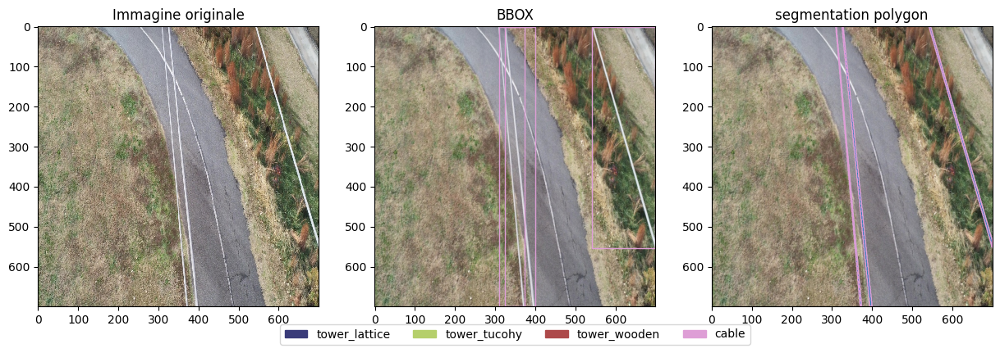

**************PREDIZIONI**************


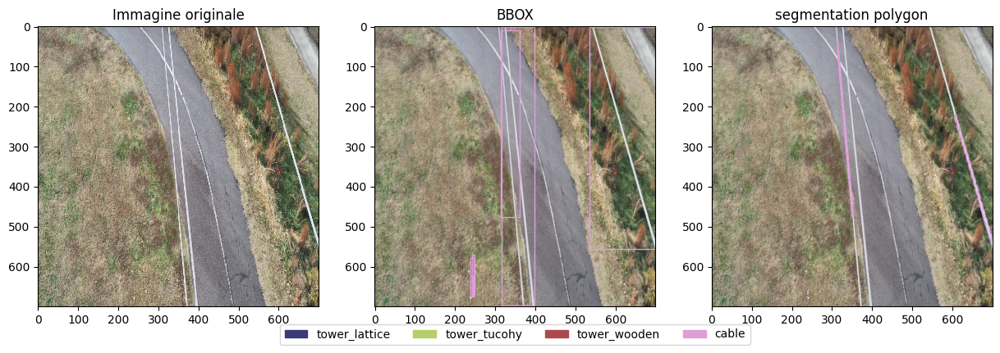

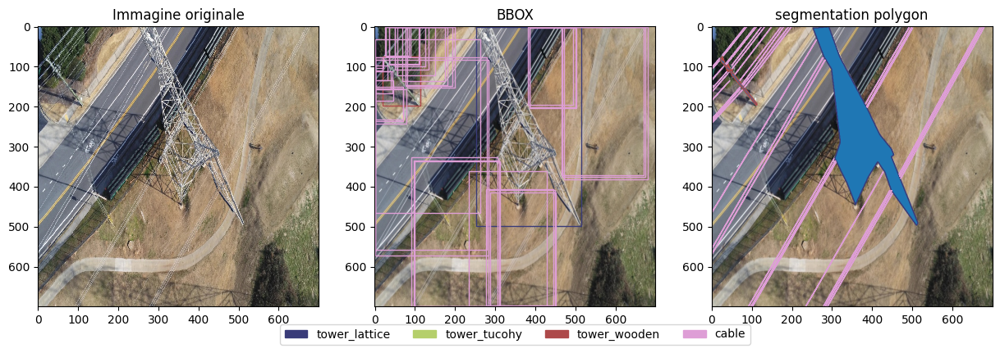

**************PREDIZIONI**************


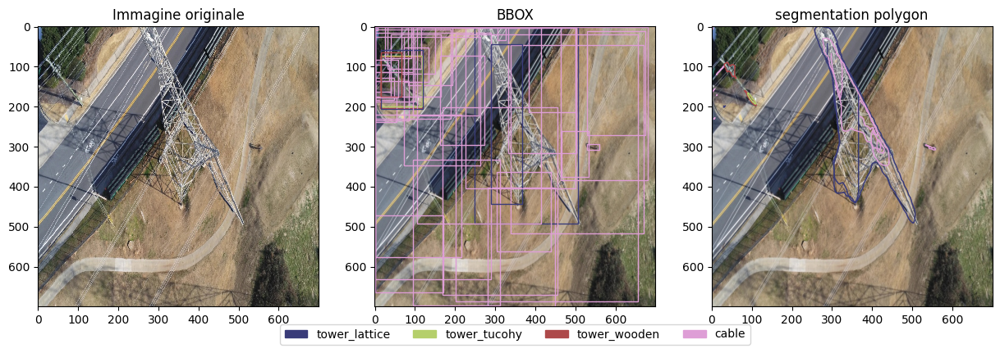

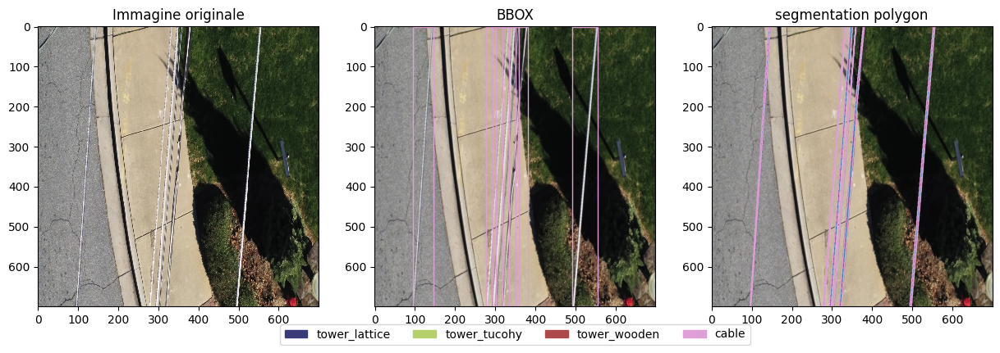

**************PREDIZIONI**************


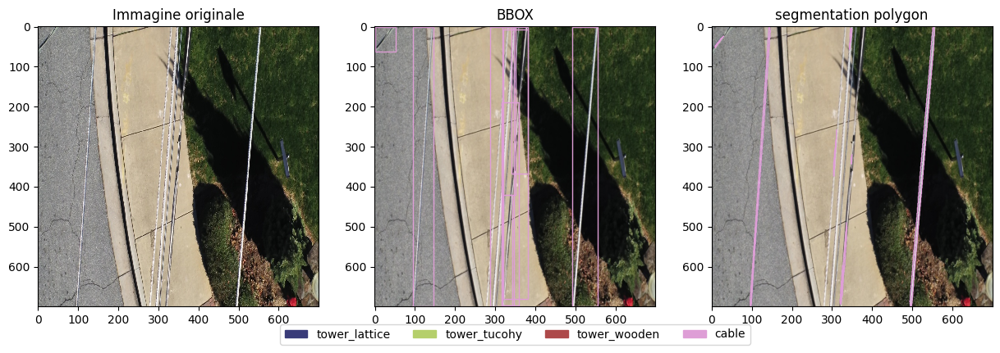

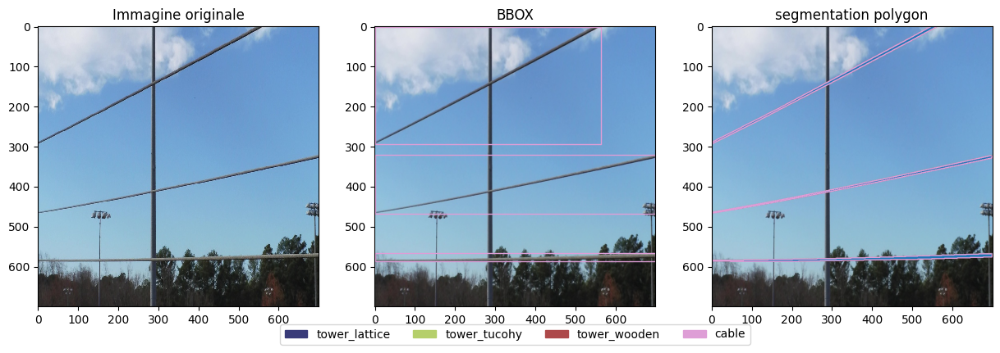

**************PREDIZIONI**************


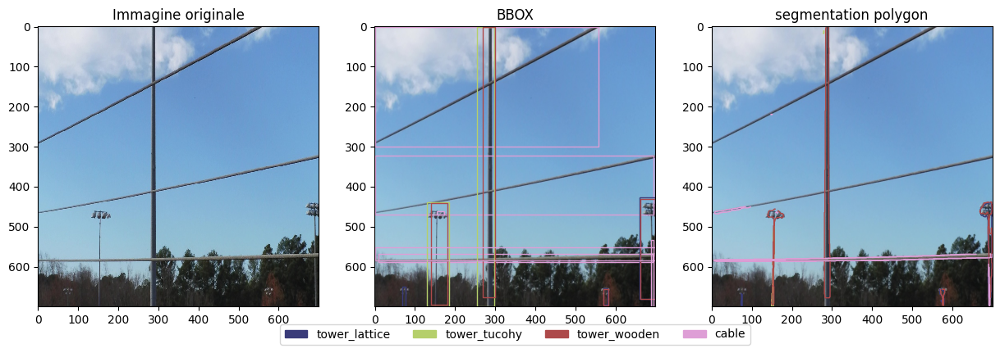

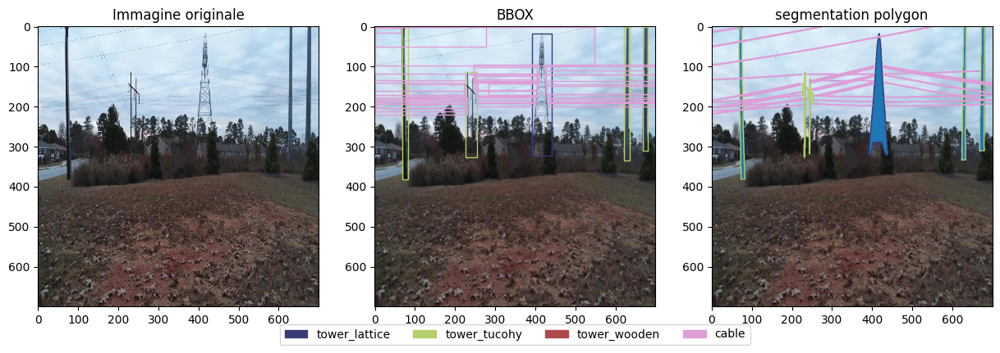

**************PREDIZIONI**************


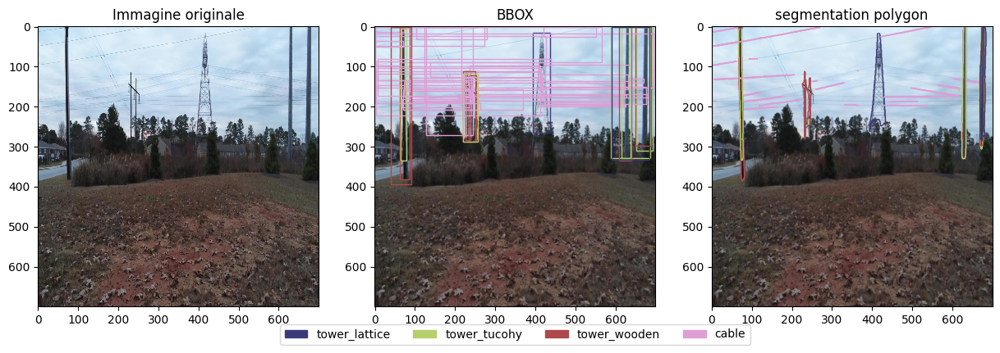

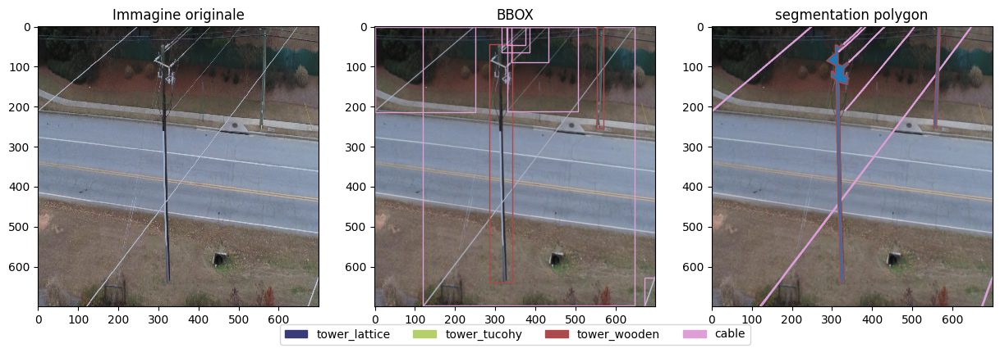

**************PREDIZIONI**************


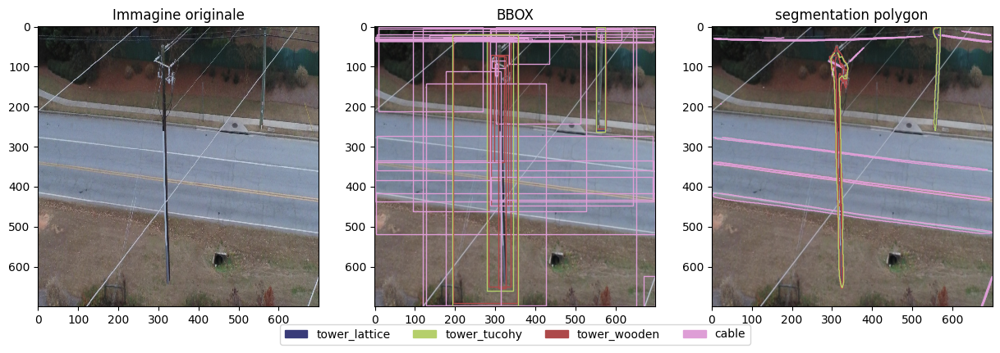

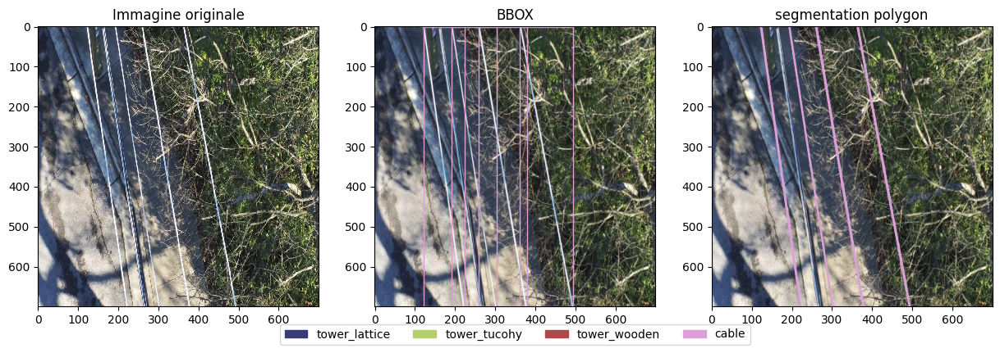

**************PREDIZIONI**************


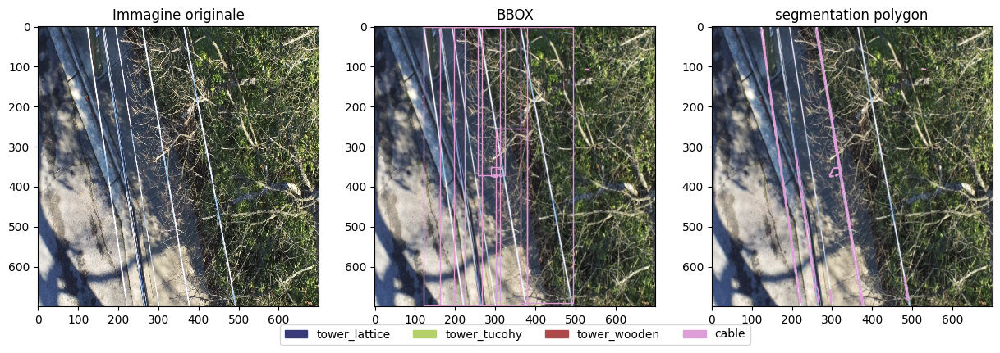

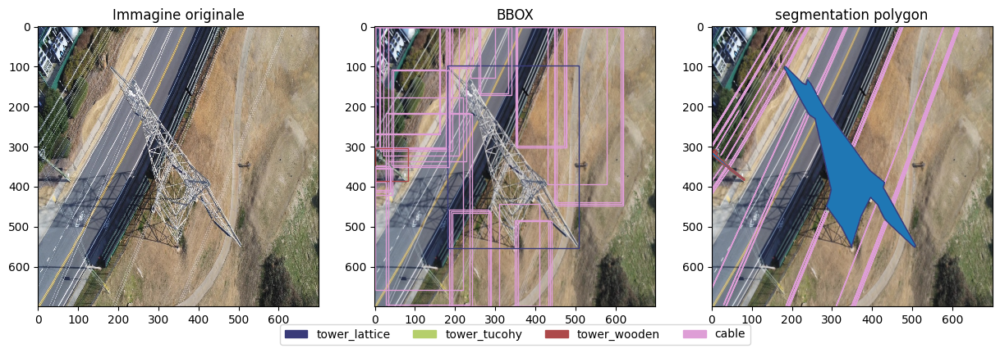

**************PREDIZIONI**************


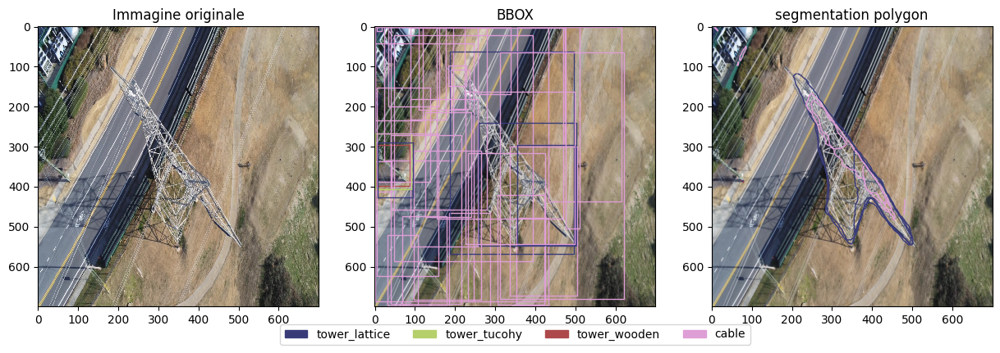

In [ ]:
file_json="./working/bbox658_segm433.json"
detections=coco_test.loadRes(file_json)
for batch_id,batch in enumerate(test_loader):
    images=batch[0]
    targets=batch[1]
    curr_image=0
    for target in targets:
        img_id=target["image_id"].item()
        displayImageWithBoxesAndMasksArray(images[curr_image],target,COLORS,categories)
        print("**************PREDICTIONS**************")
        displayImageWithBoxesAndMasksWithCounts(detections,COLORS,img_id,IMGSRC_TEST,categories)
        curr_image+=1
    break